In [1]:
from chipanalysis.utils.file_reader import *
from chipanalysis.utils.maye_video_axio  import *

from pathlib import Path
from aicspylibczi import CziFile
import matplotlib.pyplot as plt
import numpy as np
from chipanalysis.utils.ROI_selector import ROI_selector, ROI_selector_down
from PIL import Image


%load_ext autoreload
%autoreload 2

%matplotlib widget


In [2]:
root_path = "/Users/bisot/Documents/PostDoc2/test_data"
# root_path = "/Volumes/vangestel/Coco/ZeissData/data_final/AX2+air+bac"

fig_path = "/Users/bisot/Documents/PostDoc2/test_data"

czi_name = "CB27-01.czi"
# czi_name = "CB2-01_S2.czi "

czi_path = Path(root_path,czi_name)
czi = CziFile(czi_path)

dims = czi.dims
sizes = czi.size

dim_sizes = dict(zip(dims, sizes))
dim_sizes["T"]
pixel_size = get_pixel_sizes_um(czi)
times = get_timestamps_by_T(czi, C=0, Z=0)


.//Scaling//Distance[@Id='X']//Value
.//Scaling//Distance[@Id='Y']//Value


In [272]:
pixel_size["X"]*(7633-1354)

5932.572514824199

In [3]:
channel = 2
time = 0
img, img_disp = get_frame(czi,time,channel)

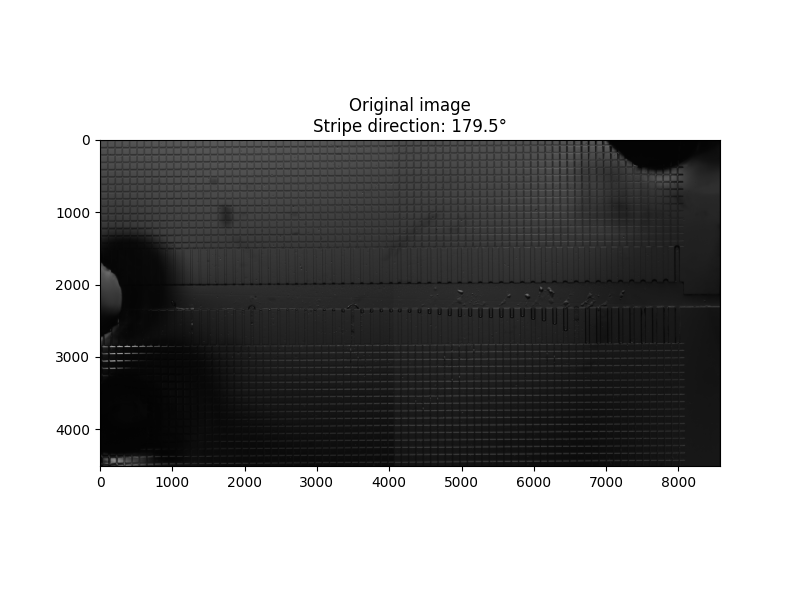

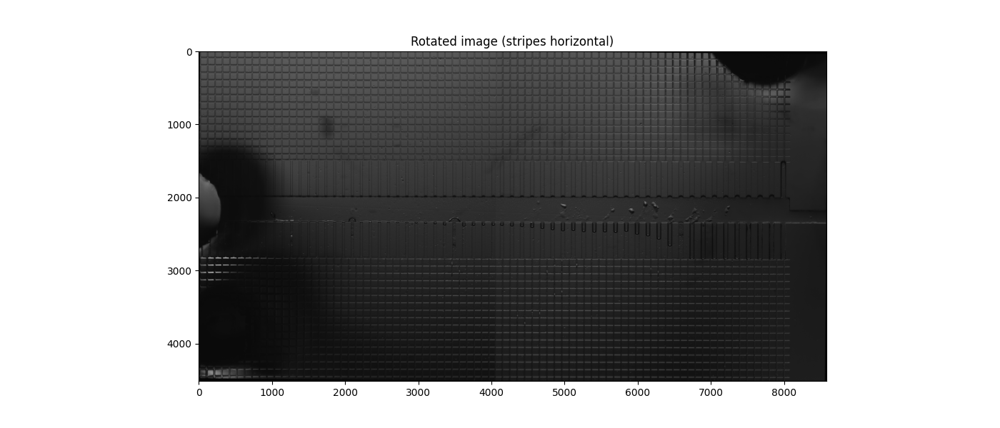

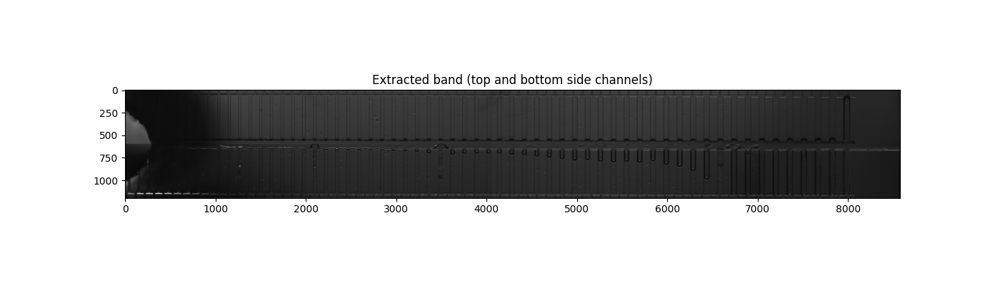

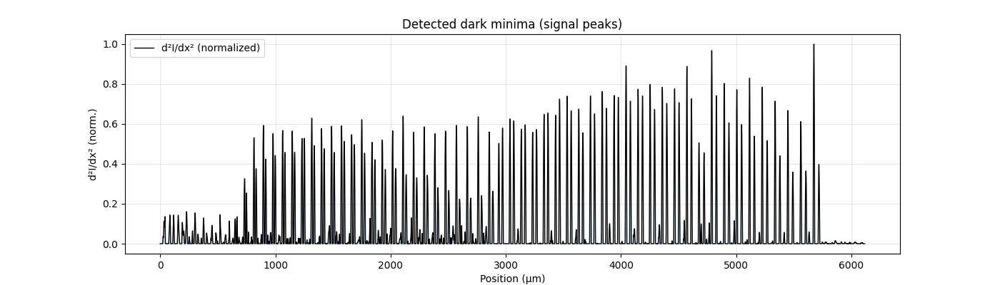

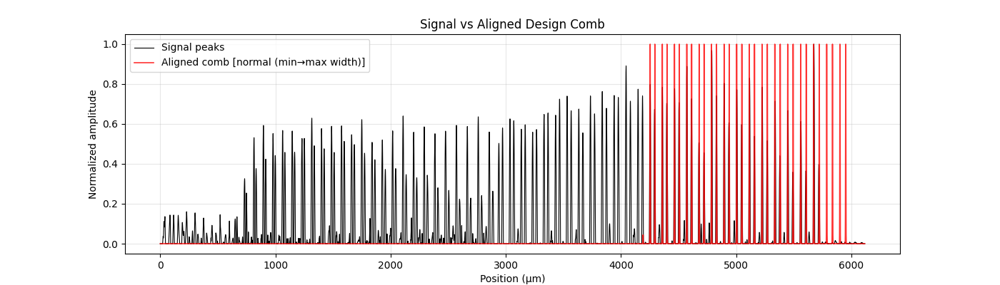

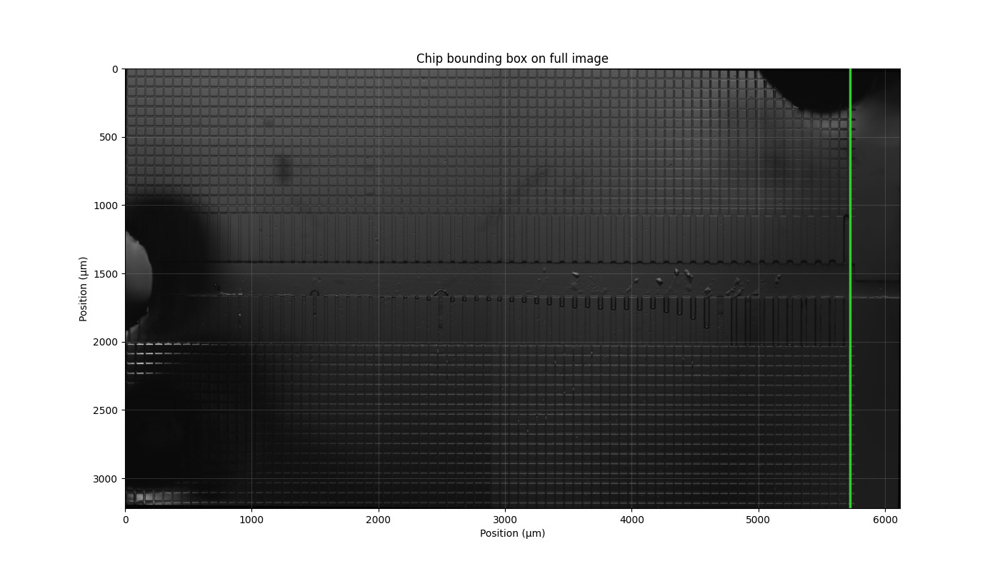

In [4]:
from chipanalysis.chip_alignment import align_chip_to_image,get_roi_from_result
result = align_chip_to_image(img, pixel_size_um=pixel_size["X"], debug=True)
result["success"]= True


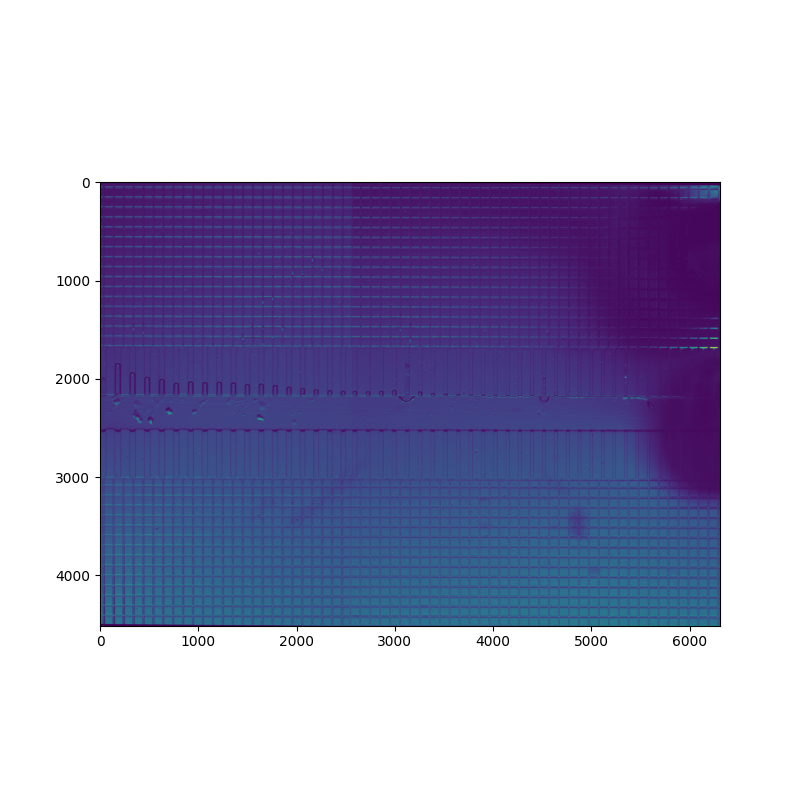

In [340]:
img, img_disp = get_frame(czi,time,2)

roi, coords = get_roi_from_result(
    result,
    result['rotate_fn'](img) ,
    pad_left_um=-500.0,   # expand chip box leftward (µm)
    pad_right_um=-1000.0,  # expand chip box rightward (µm)
    pad_top_um=2000.0,    # pad above & below main channel centre (symmetric)
)
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(roi)

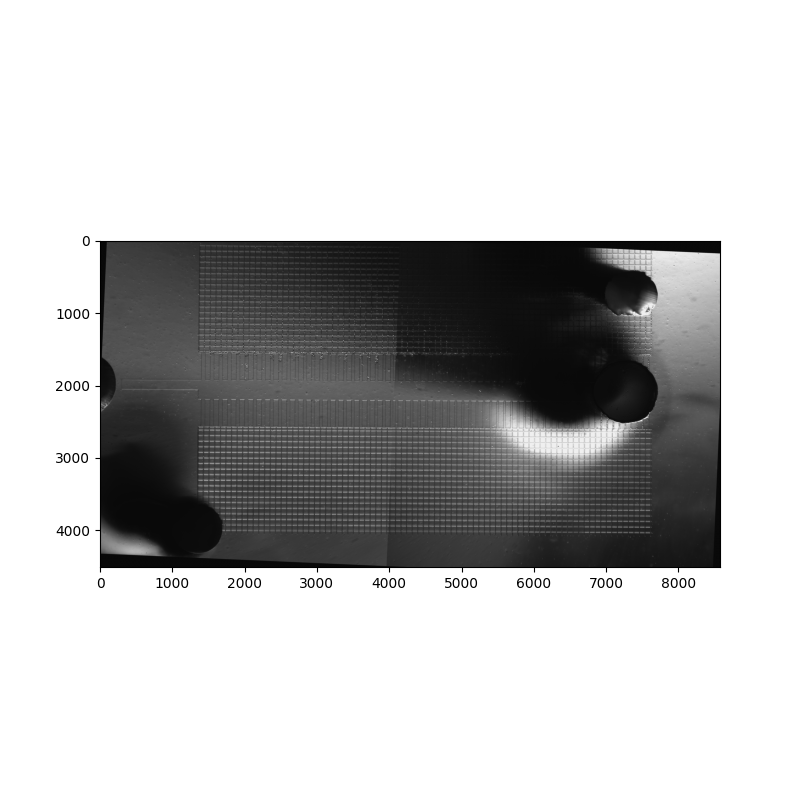

In [265]:
# img, img_disp = get_frame(czi,time,channel,roi = roi)
img, img_disp = get_frame(czi,time,channel)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(ndimage.rotate(img_disp, peak_theta_deg-90, reshape=False), cmap='gray')

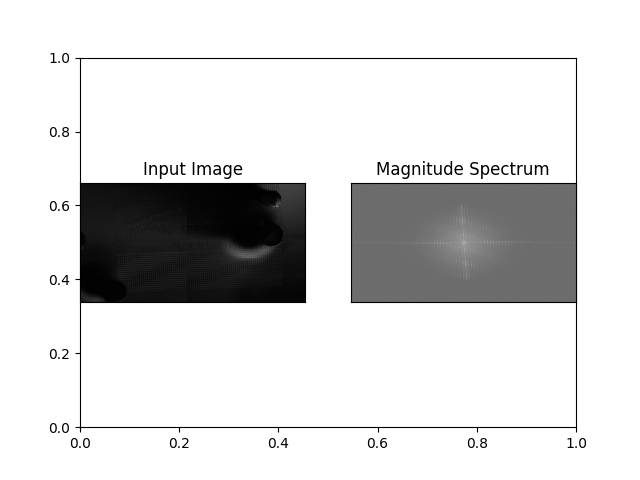

In [240]:
fig,ax = plt.subplots()

from scipy import ndimage, datasets
img_rotate = ndimage.rotate(img, 0, reshape=False)
f = np.fft.fft2(img_rotate)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(img_rotate, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()


Dominant direction in FFT (deg): 87.5
Estimated periodicity direction in image (deg): 177.5


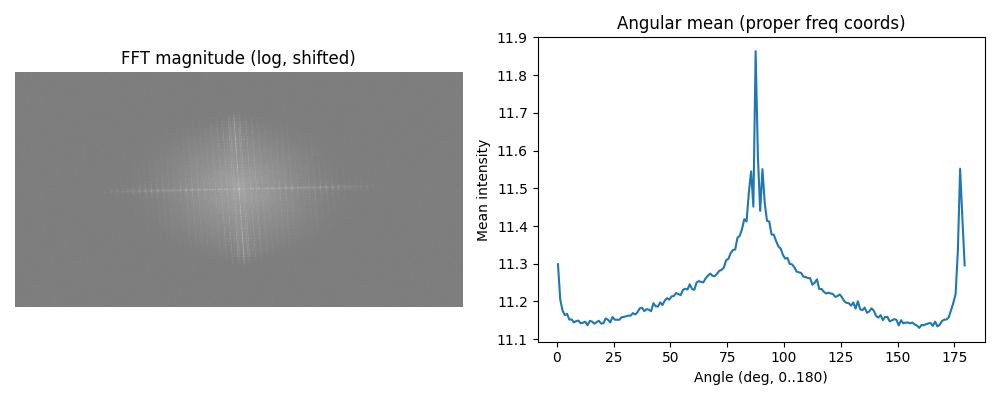

In [241]:
import numpy as np
import matplotlib.pyplot as plt

def angular_mean_spectrum_fftgrid(img, nbins=180, r_min=0.0, r_max=None,
                                 window=True, remove_dc=True, use_log=True):
    """
    Angular mean of FFT magnitude using properly scaled frequency coordinates,
    robust for rectangular images.

    r_min/r_max are in cycles/pixel (0..0.5 roughly). Good start: r_min=0.02.
    """
    img = img.astype(np.float64)

    # Optional window to reduce edge leakage (helps a lot for direction finding)
    if window:
        wy = np.hanning(img.shape[0])
        wx = np.hanning(img.shape[1])
        img = img * np.outer(wy, wx)

    if remove_dc:
        img = img - img.mean()

    F = np.fft.fftshift(np.fft.fft2(img))
    mag = np.abs(F)

    if use_log:
        mag = np.log1p(mag)  # stable log

    H, W = img.shape

    # Frequency coordinates (cycles/pixel)
    ky = np.fft.fftshift(np.fft.fftfreq(H, d=1.0))
    kx = np.fft.fftshift(np.fft.fftfreq(W, d=1.0))
    KX, KY = np.meshgrid(kx, ky)

    r = np.hypot(KX, KY)
    theta = np.arctan2(KY, KX)           # [-pi, pi]
    theta = np.mod(theta, np.pi)         # fold to [0, pi) because directions repeat every 180°

    if r_max is None:
        r_max = r.max()

    mask = (r >= r_min) & (r <= r_max)

    edges = np.linspace(0.0, np.pi, nbins + 1)
    bin_idx = np.digitize(theta[mask], edges) - 1
    bin_idx = np.clip(bin_idx, 0, nbins - 1)

    vals = mag[mask]
    sums = np.bincount(bin_idx, weights=vals, minlength=nbins)
    counts = np.bincount(bin_idx, minlength=nbins)
    ang_mean = sums / np.maximum(counts, 1)

    theta_centers = 0.5 * (edges[:-1] + edges[1:])
    return theta_centers, ang_mean, mag

# ---- example usage with your img_rotate ----
theta, ang_mean, mag_log = angular_mean_spectrum_fftgrid(
    img_rotate,
    nbins=180,
    r_min=0.02,   # ignore very low frequencies (tune!)
    r_max=0.5,    # Nyquist
    window=True,
    remove_dc=True,
    use_log=True
)

peak = np.argmax(ang_mean)
peak_theta_deg = np.degrees(theta[peak])
spatial_dir_deg = (peak_theta_deg + 90) % 180  # peaks in FFT are perpendicular to stripe direction

print(f"Dominant direction in FFT (deg): {peak_theta_deg:.1f}")
print(f"Estimated periodicity direction in image (deg): {spatial_dir_deg:.1f}")

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(mag_log, cmap="gray")
plt.title("FFT magnitude (log, shifted)")
plt.axis("off")

plt.subplot(1,2,2)
plt.plot(np.degrees(theta), ang_mean)
plt.xlabel("Angle (deg, 0..180)")
plt.ylabel("Mean intensity")
plt.title("Angular mean (proper freq coords)")
plt.tight_layout()
plt.show()

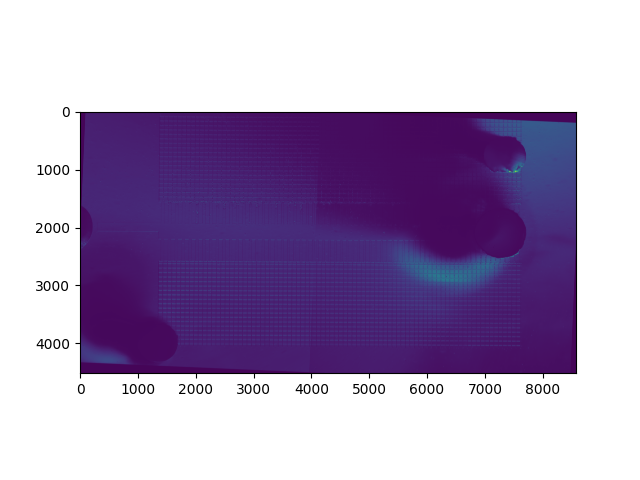

In [242]:
fig,ax = plt.subplots()

from scipy import ndimage, datasets
img_rotate2 = ndimage.rotate(img_rotate, peak_theta_deg-90, reshape=False)
ax.imshow(img_rotate2)

In [243]:
pixel_size["X"]

0.9448276022972129

In [244]:
# from scipy.signal import periodogram
# import numpy as np
# period_um = 73
# period_pixel = int(period_um/pixel_size["X"])
# def periodicity_fft(x, fs, period,window=0):
#     f, Pxx = periodogram((x - np.mean(x)), fs)
#     target = 1 / period
#     idx = np.argmin(np.abs(f - target))

#     return np.mean(Pxx[idx-window:idx+window+1]) / np.sum(Pxx)
# fs = 1
# periodicity_fft(img[2500,:],fs,period_pixel),periodicity_fft(img[1300,:],fs,period_pixel)
# y = [periodicity_fft(img[x,:],fs,period_pixel,int(period_pixel//30)) for x in range(img.shape[0])]
# yanti = [periodicity_fft(img[x,2000:],fs,period_pixel+period_pixel/2,int(period_pixel//10)) for x in range(img.shape[0])]
# peakness = np.array(y)/np.array(yanti)
# fig,ax = plt.subplots()
# ax.plot(peakness)


In [245]:
# main_channel_width_um = 250
# side_sub_channel_width_um = 355
# middle_um = main_channel_width_um+2*side_sub_channel_width_um
# middle_px = middle_um/pixel_size["X"]
# def fit_box(x0,middle_px,signal):
#     x1 = x0 +int(middle_px)
#     return(np.mean(signal[x0:x1]**2))

# fits=[fit_box(x0,middle_px,peakness) for x0 in range(len(y)-int(middle_px))]
# fig,ax = plt.subplots()
# ax.plot(fits)
# x_middle = np.argmin(fits)+middle_px/2
# begin_main_channel = x_middle - main_channel_width_um/pixel_size["X"]/2
# end_main_channel = x_middle + main_channel_width_um/pixel_size["X"]/2

In [246]:

# fig,ax = plt.subplots()
# ax.plot(peakness)
# x0 = x_middle-middle_px/2
# x1 = x0 +middle_px
# ax.axvline(x0,0,0.06,color = "red")
# ax.axvline(x1,0,0.06,color = "red")
# ax.axvline(x_middle,0,0.06,color = "red")



In [247]:
# main_channel_width_px = main_channel_width_um/pixel_size["X"]
# fig,ax = plt.subplots()
# ax.imshow(img_rotate2)
# ax.axhline(x_middle-main_channel_width_px/2,color = "red")
# ax.axhline(x_middle+main_channel_width_px/2,color = "red")
# ax.axhline(x_middle-middle_px/2,color = "red")
# ax.axhline(x_middle+middle_px/2,color = "red")


In [248]:
# from scipy.signal import detrend
# period_um = 53
# period_pixel = int(period_um/pixel_size["X"])
# fig,ax = plt.subplots()
# x = 1750
# x_array= img_rotate2[x,2000:]
# f, Pxx = periodogram((x_array - np.mean(x_array))/np.std(x_array), fs)
# ax.plot(f,np.log10(Pxx))
# # x = 1720
# # x_array= img_rotate2[x,2000:]
# # f, Pxx = periodogram((x_array - np.mean(x_array))/np.std(x_array), fs)
# # ax.plot(f,np.log10(Pxx))
# x = 2400
# x_array= img_rotate2[x,2000:]
# f, Pxx = periodogram((x_array - np.mean(x_array))/np.std(x_array), fs)
# ax.plot(f,np.log10(Pxx))
# x = 2000
# x_array= img_rotate2[x,2000:]
# f, Pxx = periodogram((x_array - np.mean(x_array))/np.std(x_array), fs)
# ax.plot(f,np.log10(Pxx))
# target = 1 / period_pixel
# ax.axvline(target,color = "red")


In [249]:
# fig,ax = plt.subplots()
# x = 2100
# x_array= img_rotate2[x,1000:]
# ax.plot(x_array)
# x = 2350
# x_array= img_rotate2[x,1000:]
# ax.plot(x_array)

In [250]:
import numpy as np
from numpy.strings import strip
import scipy.ndimage as ndi
from scipy.signal import welch, find_peaks
import matplotlib.pyplot as plt

def structure_tensor_coherence(strip, smooth_sigma=2):
    """
    Measures how organized / anisotropic the strip is.
    High when there are strong aligned structures.
    """
    gx = ndi.sobel(strip, axis=1).astype(np.float64)
    gy = ndi.sobel(strip, axis=0).astype(np.float64)

    Jxx = ndi.gaussian_filter(gx * gx, smooth_sigma)
    Jyy = ndi.gaussian_filter(gy * gy, smooth_sigma)
    Jxy = ndi.gaussian_filter(gx * gy, smooth_sigma)

    num = np.sqrt((Jxx - Jyy)**2 + 4 * Jxy**2)
    den = Jxx + Jyy + 1e-12
    coherence = num / den
    return np.mean(coherence)

def block_average(img, step):
    h, w = img.shape
    h2 = h // step
    w2 = w // step

    img = img[:h2*step, :w2*step]  # trim edges
    return img.reshape(h2, step, w2, step).mean(axis=(1,3))

def structure_tensor_coherence(strip, smooth_sigma=2,step =1):
    """
    Measures how organized / anisotropic the strip is.
    High when there are strong aligned structures.
    """
    strip_small = block_average(strip, step=step)
    gx = ndi.sobel(strip_small, axis=1).astype(np.float64)
    gy = ndi.sobel(strip_small, axis=0).astype(np.float64)

    Jxx = ndi.gaussian_filter(gx * gx, smooth_sigma)
    Jyy = ndi.gaussian_filter(gy * gy, smooth_sigma)
    Jxy = ndi.gaussian_filter(gx * gy, smooth_sigma)

    num = np.sqrt((Jxx - Jyy)**2 + 4 * Jxy**2)
    den = Jxx + Jyy + 1e-12
    coherence = num / den
    return np.mean(coherence)

def periodicity_score_from_autocorr(profile, min_period_px, max_period_px):
    """
    Strong if profile has repeated spacing in the allowed lag range.
    """
    x = profile.astype(np.float64)
    x = x - np.mean(x)
    if np.std(x) < 1e-12:
        return 0.0

    x = x / (np.std(x) + 1e-12)

    ac = np.correlate(x, x, mode="full")
    ac = ac[len(ac)//2:]   # non-negative lags
    ac = ac / (ac[0] + 1e-12)

    lo = max(1, int(min_period_px))
    hi = min(len(ac), int(max_period_px))
    if hi <= lo + 2:
        return 0.0

    region = ac[lo:hi]
    peaks, props = find_peaks(region, prominence=0.02)

    if len(peaks) == 0:
        return 0.0

    prominences = props["prominences"]
    return np.max(prominences)

def band_contrast_score(strip):
    """
    Prevents low-information flat regions from scoring high.
    """
    return np.std(strip)

def horizontal_band_score(
    img,
    strip_height=31,
    step=1,
    min_period_px=8,
    max_period_px=80,
    blur_sigma_bg=(7, 31),
):
    """
    Returns y positions and one score per horizontal strip.
    """
    img = img.astype(np.float64)

    # remove slow background
    bg = ndi.gaussian_filter(img, blur_sigma_bg)
    hp = img - bg

    ys = []
    scores = []
    periodic_scores = []
    coherence_scores = []
    contrast_scores = []

    half = strip_height // 2

    for y in range(half, img.shape[0] - half, step):
        strip = hp[y-half:y+half+1, :]

        # average across strip height for a robust 1D profile
        profile = np.mean(strip, axis=0)

        pscore = periodicity_score_from_autocorr(
            profile,
            min_period_px=min_period_px,
            max_period_px=max_period_px
        )
        cscore = structure_tensor_coherence(strip)
        vscore = band_contrast_score(strip)

        # combine scores; log helps stabilize contrast
        score = pscore * cscore * np.log1p(vscore)

        ys.append(y)
        scores.append(score)
        periodic_scores.append(pscore)
        coherence_scores.append(cscore)
        contrast_scores.append(vscore)

    return (
        np.array(ys),
        np.array(scores),
        np.array(periodic_scores),
        np.array(coherence_scores),
        np.array(contrast_scores),
    )
min_period_um = 40
max_period_um = 100   # choose something realistic for your structures

min_period_px = min_period_um / pixel_size["X"]
max_period_px = max_period_um / pixel_size["X"]
main_channel_width_um = 250
main_channel_width_px = int(main_channel_width_um/pixel_size["X"])
band_height = main_channel_width_px//2
band_height = 50

ys, score, pscore, cscore, vscore = horizontal_band_score(
    img_rotate2,
    strip_height=band_height,
    step=1,
    min_period_px=min_period_px,
    max_period_px=max_period_px,
    blur_sigma_bg=(5, 25),
)


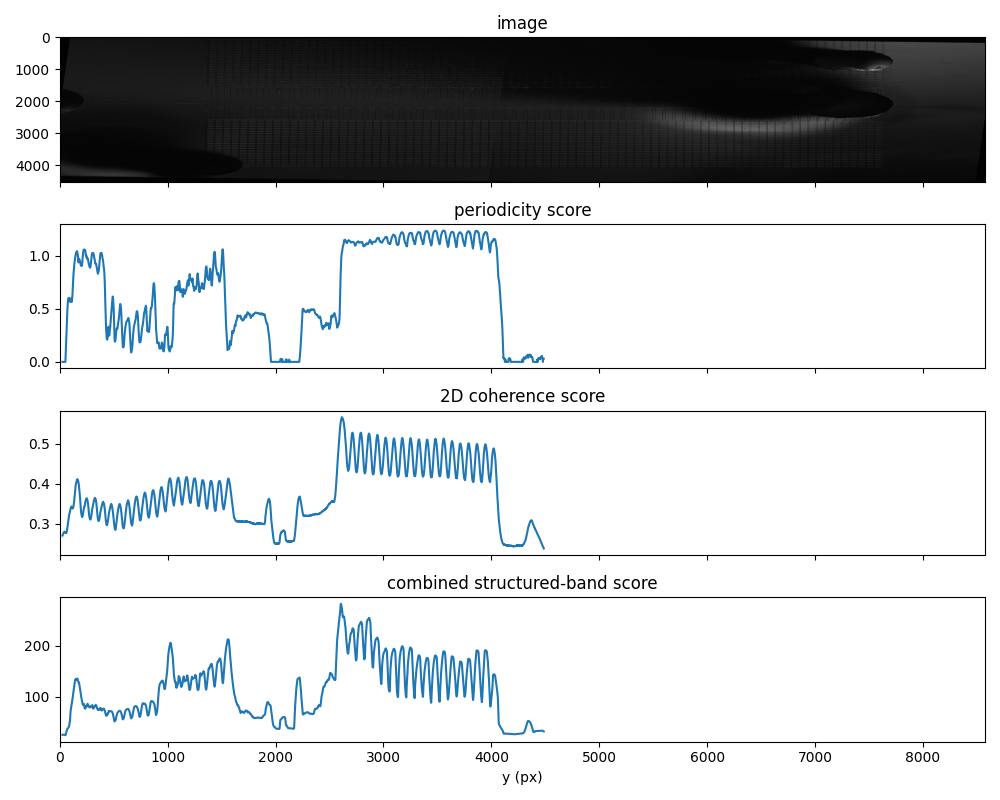

In [251]:
fig, ax = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
ax[0].imshow(img_rotate2, cmap="gray", aspect="auto")
ax[0].set_title("image")

ax[1].plot(ys, pscore)
ax[1].set_title("periodicity score")

ax[2].plot(ys, cscore)
ax[2].set_title("2D coherence score")

ax[3].plot(ys, vscore)
ax[3].set_title("combined structured-band score")
ax[3].set_xlabel("y (px)")

plt.tight_layout()

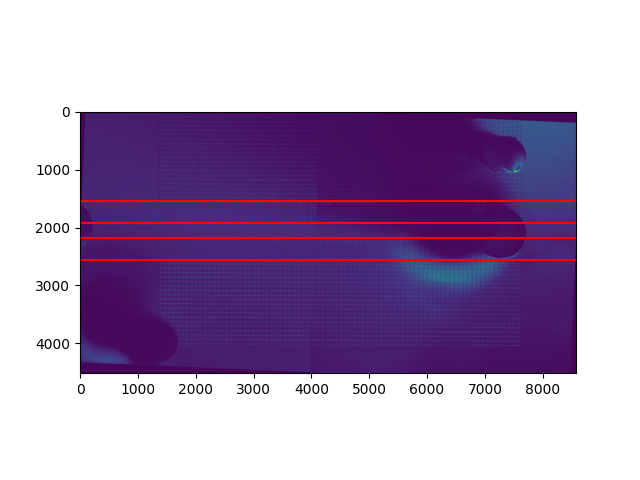

In [252]:
main_channel_width_um = 250
main_channel_width_px = main_channel_width_um/pixel_size["X"]

side_sub_channel_width_um = 355
side_sub_channel_width_px = side_sub_channel_width_um/pixel_size["X"]
middle_um = main_channel_width_um+2*side_sub_channel_width_um
middle_px = middle_um/pixel_size["X"]

def fit_box(x0,middle_px,signal):
    x1 = x0 +int(middle_px)
    return(np.mean(signal[x0:x1]))
begin = int(500//pixel_size["X"])
middle_size = middle_px
fits=[fit_box(x0,middle_size,pscore) for x0 in range(len(score)-int(middle_size))]
x_middle = np.argmin(fits[begin:])+middle_size/2+begin+ys[0]
# x_middle = np.argmin(cscore)+ys[0]

begin_main_channel = x_middle - main_channel_width_um/pixel_size["X"]/2
end_main_channel = x_middle + main_channel_width_um/pixel_size["X"]/2
main_channel_width_px = main_channel_width_um/pixel_size["X"]
fig,ax = plt.subplots()
ax.imshow(img_rotate2)
ax.axhline(x_middle-main_channel_width_px/2,color = "red")
ax.axhline(x_middle+main_channel_width_px/2,color = "red")
ax.axhline(x_middle-middle_px/2,color = "red")
ax.axhline(x_middle+middle_px/2,color = "red")


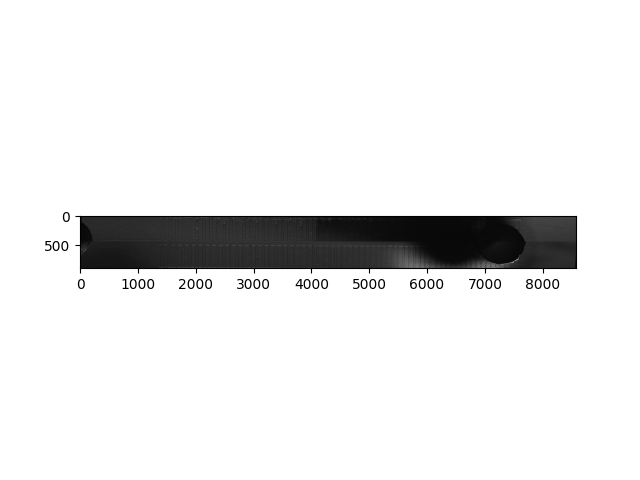

In [253]:
fig,ax = plt.subplots()
band = img_rotate2[int(x_middle-middle_px/2-side_sub_channel_width_px/10):int(x_middle-middle_px/2+side_sub_channel_width_px+side_sub_channel_width_px/10),:]
band2 = img_rotate2[int(x_middle+middle_px/2-side_sub_channel_width_px-side_sub_channel_width_px/10):int(x_middle+middle_px/2+side_sub_channel_width_px/10),:]
band = np.concatenate([band,band2],axis = 0)
ax.imshow(band,cmap = "gray")

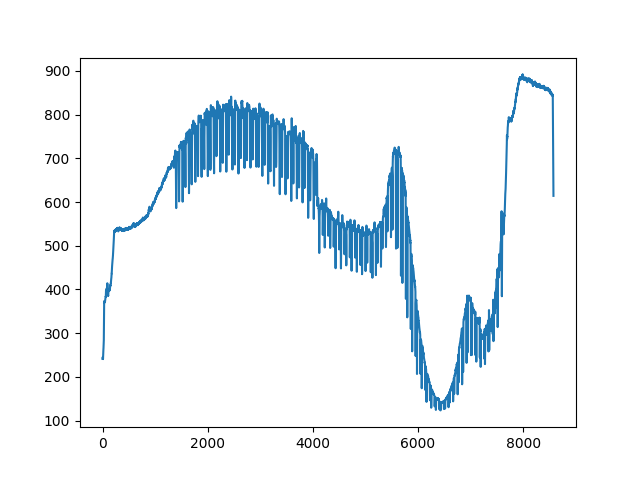

In [254]:
fig,ax = plt.subplots()
average_ppa2 = np.mean(band,axis = 0)
ax.plot(average_ppa2)

Variable-Width Channel Strip Design:
  Total strip length: 6000.0 µm
  Number of channels: 63
  Channel widths (µm): [10.0, 10.65, 11.29, 11.94, 12.58, 13.23, 13.87, 14.52, 15.16, 15.81, 16.45, 17.1, 17.74, 18.39, 19.03, 19.68, 20.32, 20.97, 21.61, 22.26, 22.9, 23.55, 24.19, 24.84, 25.48, 26.13, 26.77, 27.42, 28.06, 28.71, 29.35, 30.0, 30.65, 31.29, 31.94, 32.58, 33.23, 33.87, 34.52, 35.16, 35.81, 36.45, 37.1, 37.74, 38.39, 39.03, 39.68, 40.32, 40.97, 41.61, 42.26, 42.9, 43.55, 44.19, 44.84, 45.48, 46.13, 46.77, 47.42, 48.06, 48.71, 49.35, 50.0]
  Gap between channels: 65.0 µm
  Number of interfaces: 126


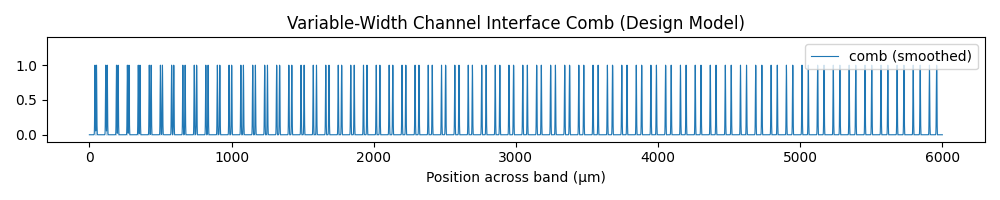

In [255]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def build_ppa_interface_comb(
    min_width_um: float = 10.0,
    max_width_um: float = 50.0,
    gap_um: float = 65.0,
    total_length_um: float = 355.0,  # rect2_width_um from your design
    orientation: str = "vertical",
    sample_dx_um: float = 0.1,       # sampling resolution for the comb signal
    smoothing_sigma_px: float = 2.0, # Gaussian broadening per interface (in samples)
):
    """
    Build a 1D 'interface comb' corresponding to the variable-channel PPA.

    The PPA has N channels with linearly varying widths (min->max),
    separated by constant gaps. The comb is:
        - 0 everywhere
        - peak at each channel/pillar interface (i.e., at leading and trailing
          edges of every channel), broadened by a Gaussian if smoothing_sigma_px > 0

    Parameters
    ----------
    min_width_um       : narrowest channel width (µm)
    max_width_um       : widest channel width (µm)
    gap_um             : constant gap (pillar width) between channels (µm)
    total_length_um    : total available length (= rect width along stacking axis)
    orientation        : "vertical" or "horizontal" (only affects axis label)
    sample_dx_um       : resolution of the returned position array (µm)
    smoothing_sigma_px : Gaussian sigma applied to each Dirac interface (in samples).
                         Set to 0 to keep sharp Diracs. ~2 gives ~5 px FWHM.

    Returns
    -------
    positions_um : np.ndarray   (x or y axis, length ~ total_length_um/dx)
    comb         : np.ndarray   0 everywhere, peak at each interface
    interface_um : list[float]  exact interface positions in µm
    widths_um    : list[float]  channel widths in order
    """
    if min_width_um > max_width_um:
        min_width_um, max_width_um = max_width_um, min_width_um

    a, b, g = float(min_width_um), float(max_width_um), float(gap_um)

    # ---- replicate the exact same N-finding logic as fill_with_variable_channels
    def total_extent(N: int) -> float:
        if N <= 0: return 0.0
        if N == 1: return a
        return N * (a + b) / 2.0 + (N - 1) * g

    N = 1
    while total_extent(N + 1) <= total_length_um + 1e-9:
        N += 1

    # linear widths
    widths_um = [a + (float(i) / (N - 1)) * (b - a) for i in range(N)] if N > 1 else [a]

    # center the pattern (same as fill_with_variable_channels)
    extent = sum(widths_um) + (N - 1) * g
    start = 0.5 * (total_length_um - extent)   # offset from 0

    # ---- collect interface positions
    interface_um = []
    pos = start
    for i, w in enumerate(widths_um):
        interface_um.append(pos)           # leading edge  (pillar -> channel)
        interface_um.append(pos + w)       # trailing edge (channel -> pillar)
        pos += w
        if i < N - 1:
            pos += g

    # ---- build sampled comb (Dirac spikes)
    positions_um = np.arange(0.0, total_length_um + sample_dx_um, sample_dx_um)
    comb = np.zeros_like(positions_um)
    for iface in interface_um:
        idx = int(round(iface / sample_dx_um))
        if 0 <= idx < len(comb):
            comb[idx] = 1.0

    # ---- broaden each spike into a Gaussian peak
    if smoothing_sigma_px > 0:
        comb = gaussian_filter1d(comb, sigma=smoothing_sigma_px)
        comb /= comb.max() + 1e-12   # renormalize to [0, 1]

    return positions_um, comb, interface_um, widths_um


# ── demo: Variable-width channels (fill_with_variable_channels) ───────────────
pos, comb, interfaces, widths = build_ppa_interface_comb(
    min_width_um=10.0,             # Narrowest channel
    max_width_um=50.0,             # Widest channel
    gap_um=65.0,                   # Gap between channels
    total_length_um=6000.0,        # Strip length (6000 µm)
    sample_dx_um=pixel_size['X'],  # Sample at pixel resolution
    smoothing_sigma_px=2.0,        # ~5 px FWHM per interface
)

print(f"Variable-Width Channel Strip Design:")
print(f"  Total strip length: 6000.0 µm")
print(f"  Number of channels: {len(widths)}")
print(f"  Channel widths (µm): {[round(w, 2) for w in widths]}")
print(f"  Gap between channels: 65.0 µm")
print(f"  Number of interfaces: {len(interfaces)}")

fig, ax = plt.subplots(figsize=(10, 2))
ax.plot(pos, comb, color="tab:blue", lw=0.8, label="comb (smoothed)")
ax.vlines(interfaces, 0, 1, colors="tab:blue", alpha=0.3, linewidth=0.8)
ax.set_xlabel("Position across band (µm)")
ax.set_title("Variable-Width Channel Interface Comb (Design Model)")
ax.set_ylim(-0.1, 1.4)
ax.legend()
plt.tight_layout()
plt.show()


Design: 63 channels, 126 interfaces
Comb template cropped to last 1800 µm  (1905 px)

Cross-correlation results:
  Normal:  shift=  2066px  ( 1952.0µm)  score=73.6
  Flipped: shift=  1355px  ( 1280.2µm)  score=135.8

Best: flipped (max→min width)  |  32/32 template interfaces in image window


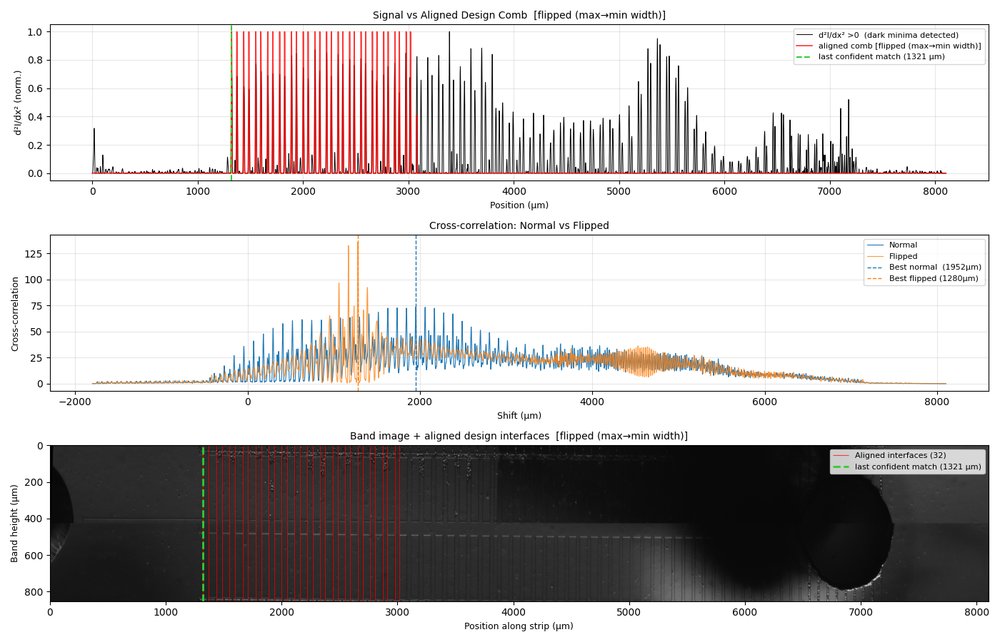

In [275]:
from scipy.signal import correlate, savgol_filter

# ── Design parameters ─────────────────────────────────────────────────────────
design_params = {
    'min_width_um': 10.0,
    'max_width_um': 50.0,
    'gap_um': 65.0,
    'total_length_um': 6000.0,
}

# ── Build full design comb, then crop to last crop_um ─────────────────────────
crop_um = 1800.0
crop_px = int(crop_um / pixel_size['X'])

pos_um, comb_design, interfaces_um, widths_um = build_ppa_interface_comb(
    **design_params, sample_dx_um=pixel_size['X'], smoothing_sigma_px=3.0,
)
n_comb_full     = len(comb_design)
template_offset = n_comb_full - crop_px        # start of [-crop_px:] window in full design
comb_design     = comb_design[-crop_px:]       # crop template to LAST crop_um
interfaces_design_px = np.array(interfaces_um) / pixel_size['X']

print(f"Design: {len(widths_um)} channels, {len(interfaces_um)} interfaces")
print(f"Comb template cropped to last {crop_um:.0f} µm  ({len(comb_design)} px)")

# ── Signal: positive second derivative to detect dark minima ─────────────────
# Dark interfaces are concave-up (d²I/dx² > 0) → one positive peak per dip.
# Flat regions have d²≈0, so no spurious response there.
# The window controls the spatial scale: set it to ~2-3× the interface dip width.
sg_window_um = 25.0   # tune: ~2-3× the interface width; try 15-40 µm
sg_window_px = int(sg_window_um / pixel_size['X'])
sg_window_px += 1 - sg_window_px % 2   # must be odd

signal      = average_ppa2.astype(float)
signal_norm = (signal - signal.min()) / (signal.max() - signal.min() + 1e-12)
d2          = savgol_filter(signal_norm, window_length=sg_window_px, polyorder=3, deriv=2)
signal_inv  = np.maximum(0, d2)          # keep only concave-up (dark minima)
signal_inv /= signal_inv.max() + 1e-12   # normalize to [0, 1]
n_signal = len(signal_inv)
n_comb   = len(comb_design)

# ── Cross-correlate (normal & flipped) ────────────────────────────────────────
xcorr_normal  = correlate(signal_inv, comb_design,       mode='full')
xcorr_flipped = correlate(signal_inv, comb_design[::-1], mode='full')
lags = np.arange(-(n_comb - 1), n_signal)

best_idx_n    = np.argmax(xcorr_normal)
best_idx_f    = np.argmax(xcorr_flipped)
shift_normal  = lags[best_idx_n];  score_normal  = xcorr_normal[best_idx_n]
shift_flipped = lags[best_idx_f];  score_flipped = xcorr_flipped[best_idx_f]

print(f"\nCross-correlation results:")
print(f"  Normal:  shift={shift_normal:6d}px  ({shift_normal*pixel_size['X']:7.1f}µm)  score={score_normal:.1f}")
print(f"  Flipped: shift={shift_flipped:6d}px  ({shift_flipped*pixel_size['X']:7.1f}µm)  score={score_flipped:.1f}")

# Only interfaces inside the [-crop_px:] window
crop_mask      = interfaces_design_px >= template_offset
ifaces_in_crop = interfaces_design_px[crop_mask] - template_offset  # 0-based within template

if score_normal >= score_flipped:
    best_shift = shift_normal
    best_comb  = comb_design.copy()
    best_interfaces_px = ifaces_in_crop + best_shift
    orientation = "normal (min→max width)"
    is_flipped  = False
else:
    best_shift = shift_flipped
    best_comb  = comb_design[::-1].copy()
    best_interfaces_px = (n_comb - 1 - ifaces_in_crop) + best_shift
    orientation = "flipped (max→min width)"
    is_flipped  = True

valid      = (best_interfaces_px >= 0) & (best_interfaces_px < n_signal)
aligned_px = np.sort(best_interfaces_px[valid])   # sorted left→right
print(f"\nBest: {orientation}  |  {valid.sum()}/{crop_mask.sum()} template interfaces in image window")

# ── Place comb in signal space for overlay ────────────────────────────────────
aligned_comb = np.zeros(n_signal)
s = int(best_shift)
sig_start  = max(0, s);  comb_start = max(0, -s)
sig_end    = min(n_signal, s + n_comb);  comb_end = comb_start + (sig_end - sig_start)
if sig_end > sig_start:
    aligned_comb[sig_start:sig_end] = best_comb[comb_start:comb_end]

# ── Last confident match: rightmost comb peak where local product is high ─────
# Evaluates max(comb × signal) within a window around each interface,
# so it requires both a comb peak AND a signal peak to be present there.
match_threshold = 0.05   # tune: lower = more permissive
peak_window_um  = 5.0    # half-width (µm) of window around each interface
peak_window_px  = max(1, int(peak_window_um / pixel_size['X']))
product = aligned_comb * signal_inv
# Normal : crop covers design's right end → rightmost in image → walk right→left
# Flipped: crop covers design's right end but it maps to LEFT in image → walk left→right
first_match_um = None
scan_order = aligned_px if is_flipped else aligned_px[::-1]
for px in scan_order:
    ipx = int(round(px))
    lo  = max(0, ipx - peak_window_px)
    hi  = min(n_signal, ipx + peak_window_px + 1)
    if hi > lo and np.max(product[lo:hi]) >= match_threshold:
        first_match_um = ipx * pixel_size['X']
        break
# ── Visualization ─────────────────────────────────────────────────────────────
# ── Visualization ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(3, 1, figsize=(14, 9))

# Panel 1: signal + aligned comb + first-match vline
ax = axes[0]
x_um = np.arange(n_signal) * pixel_size['X']
ax.plot(x_um, signal_inv,   color='black', lw=0.7, label='d²I/dx² >0  (dark minima detected)', zorder=2)
ax.plot(x_um, aligned_comb, color='red',   lw=1.2, alpha=0.8, label=f'aligned comb [{orientation}]', zorder=3)
if first_match_um is not None:
    ax.axvline(first_match_um, color='limegreen', lw=1.5, ls='--', zorder=4,
               label=f'last confident match ({first_match_um:.0f} µm)')
ax.set_xlabel('Position (µm)', fontsize=9)
ax.set_ylabel('d²I/dx² (norm.)', fontsize=9)
ax.set_title(f'Signal vs Aligned Design Comb  [{orientation}]', fontsize=10)
ax.legend(fontsize=8, loc='upper right')
ax.grid(True, alpha=0.3)

# Panel 2: cross-correlation curves
ax = axes[1]
lags_um = lags * pixel_size['X']
ax.plot(lags_um, xcorr_normal,  lw=0.8, color='tab:blue',   label='Normal')
ax.plot(lags_um, xcorr_flipped, lw=0.8, color='tab:orange', alpha=0.8, label='Flipped')
ax.axvline(shift_normal  * pixel_size['X'], color='tab:blue',   ls='--', lw=1,
           label=f'Best normal  ({shift_normal*pixel_size["X"]:.0f}µm)')
ax.axvline(shift_flipped * pixel_size['X'], color='tab:orange', ls='--', lw=1,
           label=f'Best flipped ({shift_flipped*pixel_size["X"]:.0f}µm)')
ax.set_xlabel('Shift (µm)', fontsize=9)
ax.set_ylabel('Cross-correlation', fontsize=9)
ax.set_title('Cross-correlation: Normal vs Flipped', fontsize=10)
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)

# Panel 3: band image + red interface vlines + green first-match vline
ax = axes[2]
band_crop   = band[:, :n_signal]
band_extent = [0, n_signal * pixel_size['X'], band_crop.shape[0] * pixel_size['X'], 0]
ax.imshow(band_crop, cmap='gray', aspect='auto', extent=band_extent)
ax.vlines(aligned_px * pixel_size['X'], 0, band_crop.shape[0] * pixel_size['X'],
          colors='red', alpha=0.7, lw=0.8, label=f'Aligned interfaces ({valid.sum()})')
if first_match_um is not None:
    ax.axvline(first_match_um, color='limegreen', lw=2.0, ls='--',
               label=f'last confident match ({first_match_um:.0f} µm)')
ax.set_xlabel('Position along strip (µm)', fontsize=9)
ax.set_ylabel('Band height (µm)', fontsize=9)
ax.set_title(f'Band image + aligned design interfaces  [{orientation}]', fontsize=10)
ax.legend(fontsize=8, loc='upper right')
plt.tight_layout()

plt.tight_layout()
plt.show()


Chip bounding box (side extensions excluded):
  x : [1321 µm,  7321 µm]  →  6000 µm wide
  y : [54 µm,  3814 µm]  →  3760 µm tall
  Middle zone height : 960 µm
  PPA1 height each side : 1400 µm


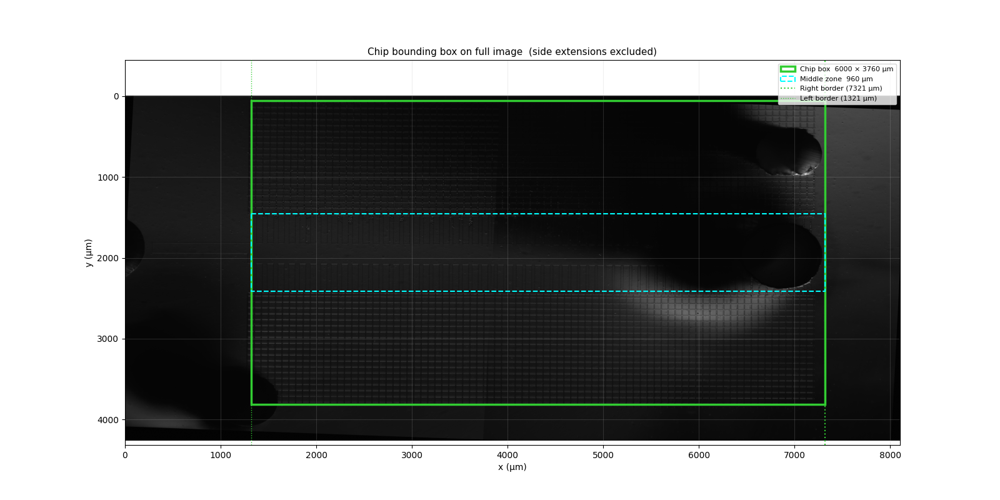

In [276]:

# ── Chip bounding box on full image ───────────────────────────────────────────
# Combines:
#   first_match_um  – right border of the PPA strip (x-direction, from comb alignment)
#   x_middle        – y-centre of chip (from middle-channel detection)
#   middle_px       – height of the middle zone (main channel + 2×side sub-channels)
#   design_params['total_length_um'] – full PPA strip length (6000 µm)
#   rect1_width_um  – PPA1 thickness on each side (1400 µm, from PPA_Chip_final.py)
# Side extensions (channel_extend_left=1000 µm, channel_extend_right=1500 µm) are EXCLUDED.

from matplotlib.patches import Rectangle

strip_length_um = design_params['total_length_um']   # 6000 µm (x-direction)
rect1_width_um  = 1400.0                              # PPA1 height each side (µm)
rect1_width_px  = rect1_width_um / pixel_size['X']

# ── Box corners (µm, imshow y-axis: 0 = top of image) ────────────────────────
# Normal : first_match_um is the RIGHT edge of chip in image → extends left
# Flipped: first_match_um is the LEFT  edge of chip in image → extends right
if is_flipped:
    chip_left_um  = first_match_um
    chip_right_um = first_match_um + strip_length_um
else:
    chip_right_um = first_match_um
    chip_left_um  = chip_right_um - strip_length_um

chip_top_um    = (x_middle - middle_px / 2 - rect1_width_px) * pixel_size['X']
chip_bottom_um = (x_middle + middle_px / 2 + rect1_width_px) * pixel_size['X']

mid_top_um     = (x_middle - middle_px / 2) * pixel_size['X']
mid_bottom_um  = (x_middle + middle_px / 2) * pixel_size['X']

chip_w_um = chip_right_um  - chip_left_um
chip_h_um = chip_bottom_um - chip_top_um

print("Chip bounding box (side extensions excluded):")
print(f"  x : [{chip_left_um:.0f} µm,  {chip_right_um:.0f} µm]  →  {chip_w_um:.0f} µm wide")
print(f"  y : [{chip_top_um:.0f} µm,  {chip_bottom_um:.0f} µm]  →  {chip_h_um:.0f} µm tall")
print(f"  Middle zone height : {middle_um:.0f} µm")
print(f"  PPA1 height each side : {rect1_width_um:.0f} µm")

# ── Plot ──────────────────────────────────────────────────────────────────────
H_img, W_img = img_rotate2.shape
img_extent   = [0, W_img * pixel_size['X'], H_img * pixel_size['X'], 0]
x_pad, y_pad = 500, 500   # µm of whitespace outside image if box overflows

fig, ax = plt.subplots(figsize=(16, 8))
ax.imshow(img_rotate2, cmap='gray', aspect='auto', extent=img_extent)

# Green box: full chip (PPA1 top + middle zone + PPA1 bottom)
ax.add_patch(Rectangle(
    (chip_left_um, chip_top_um), chip_w_um, chip_h_um,
    linewidth=2.5, edgecolor='limegreen', facecolor='none', zorder=5,
    label=f'Chip box  {chip_w_um:.0f} × {chip_h_um:.0f} µm'
))

# Cyan dashed box: middle zone only (main channel + 2×side sub-channels)
ax.add_patch(Rectangle(
    (chip_left_um, mid_top_um), chip_w_um, mid_bottom_um - mid_top_um,
    linewidth=1.5, edgecolor='cyan', facecolor='none', linestyle='--', zorder=5,
    label=f'Middle zone  {middle_um:.0f} µm'
))

# Vertical lines for left / right chip borders
ax.axvline(chip_right_um, color='limegreen', lw=1.5, ls=':', zorder=4,
           label=f'Right border ({chip_right_um:.0f} µm)')
ax.axvline(chip_left_um,  color='limegreen', lw=1.0, ls=':', zorder=4,
           label=f'Left border ({chip_left_um:.0f} µm)')

# Expand axes to show box even if it extends outside the image
ax.set_xlim(min(chip_left_um  - x_pad, 0),
            max(chip_right_um + x_pad, W_img * pixel_size['X']))
ax.set_ylim(max(chip_bottom_um + y_pad, H_img * pixel_size['X']),
            min(chip_top_um   - y_pad, 0))

ax.set_xlabel('x (µm)', fontsize=10)
ax.set_ylabel('y (µm)', fontsize=10)

ax.set_title('Chip bounding box on full image  (side extensions excluded)', fontsize=11)

ax.legend(fontsize=8, loc='upper right')

ax.grid(True, alpha=0.2)

In [258]:
ef2e2

NameError: name 'ef2e2' is not defined

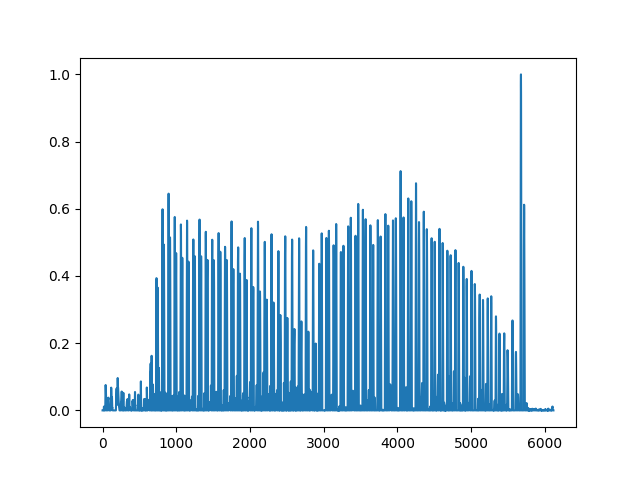

In [ ]:
xcorr_normal  = correlate(signal_inv, comb_design,       mode='full')
xcorr_flipped = correlate(signal_inv, comb_design[::-1], mode='full')
fig,ax = plt.subplots()
ax.plot(x_um,signal_inv,label = "normal")
# ax.plot(x_um,comb_design[::-1],label = "normal")

# ax.plot(xcorr_flipped,label = "flipped")    

Best shift (normal comb):  198 pixels, correlation: 16.3711
Best shift (flipped comb): 249 pixels, correlation: 10.9433

Best configuration: normal comb, shift = 198 pixels


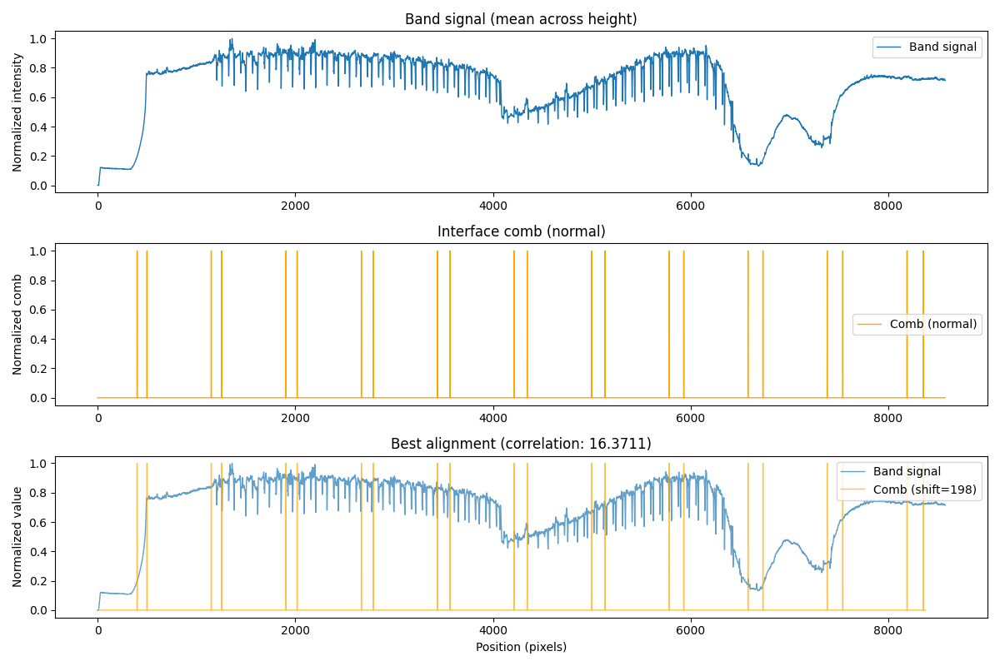


Alignment Summary:
  Shift amount: 198 pixels
  Comb orientation: normal
  Correlation score: 16.3711
  Physical shift: 187.08 µm


In [ ]:
wef3e

NameError: name 'wef3e' is not defined

/var/folders/lc/xdhphxss45zfz02b14j8dhb00000gp/T/ipykernel_40606/2769659666.py:6: RuntimeWarning: divide by zero encountered in log
  ax.plot(np.log(pscore))


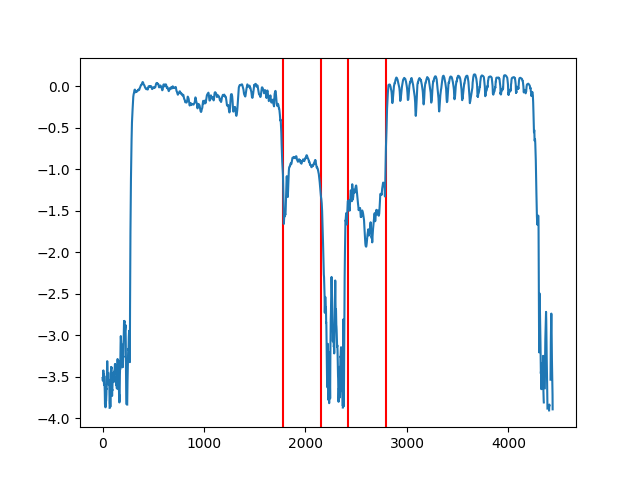

In [ ]:
fig,ax = plt.subplots()
ax.axvline(x_middle-main_channel_width_px/2,color = "red")
ax.axvline(x_middle+main_channel_width_px/2,color = "red")
ax.axvline(x_middle-middle_px/2,color = "red")
ax.axvline(x_middle+middle_px/2,color = "red")
ax.plot(np.log(pscore))

In [ ]:
wewve

NameError: name 'wewve' is not defined

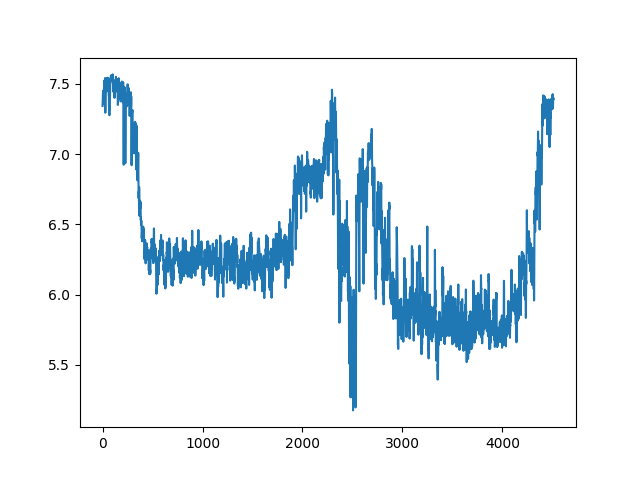

In [ ]:
from scipy.signal import periodogram
main_channel_width_um = 250
side_sub_channel_width_um = 355
middle_um = main_channel_width_um+2*side_sub_channel_width_um
middle_px = middle_um/pixel_size["X"]
def spectral_entropy(Pxx):
    p = Pxx / np.sum(Pxx)
    return -np.sum(p * np.log(p + 1e-12))

def periodicity_fft(x, fs, period,window=0):
    f, Pxx = periodogram((x - np.mean(x)), 1)
    target = 1 / period
    idx = np.argmin(np.abs(f - target))

def periodicity_entropy(x, min_period):
    f, Pxx = periodogram((x - np.mean(x)), 1)
    target = 1 / min_period
    idx = np.argmin(np.abs(f - target))

    return spectral_entropy(Pxx[idx:])

min_period_um = 50
min_period_pixel = int(min_period_um/pixel_size["X"])
y = [periodicity_entropy(img[x,2000:],min_period_pixel) for x in range(img.shape[0])]
fig,ax = plt.subplots()
ax.plot(y)

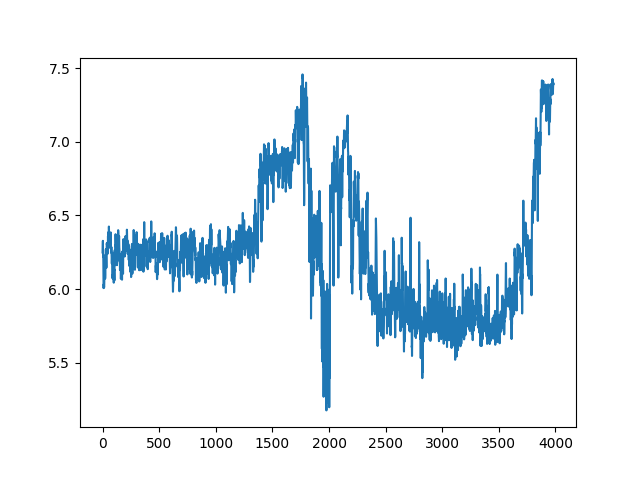

In [ ]:
def fit_box(x0,middle_px,signal):
    x1 = x0 +int(middle_px)
    return(-np.mean(signal[x0:x1]))
begin = int(500//pixel_size["X"])
fits=[fit_box(x0,middle_px,y) for x0 in range(len(y)-int(middle_px))]
x_middle = np.argmin(fits[begin:])+middle_px/2+begin
begin_main_channel = x_middle - main_channel_width_um/pixel_size["X"]/2
end_main_channel = x_middle + main_channel_width_um/pixel_size["X"]/2
fig,ax = plt.subplots()
ax.plot(y[begin:])

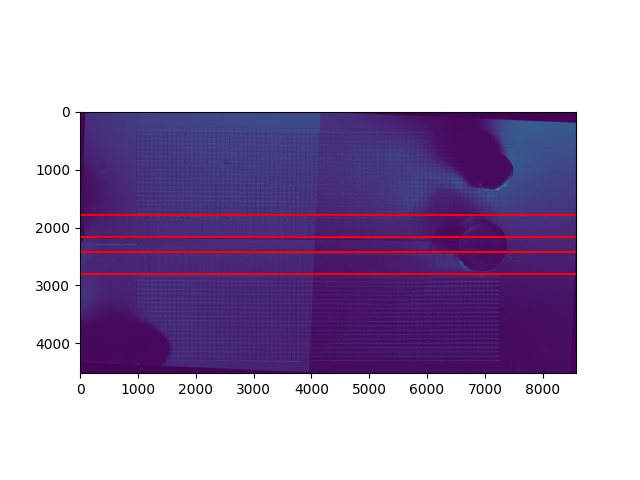

In [ ]:
main_channel_width_px = main_channel_width_um/pixel_size["X"]
fig,ax = plt.subplots()
ax.imshow(img_rotate2)
ax.axhline(x_middle-main_channel_width_px/2,color = "red")
ax.axhline(x_middle+main_channel_width_px/2,color = "red")
ax.axhline(x_middle-middle_px/2,color = "red")
ax.axhline(x_middle+middle_px/2,color = "red")


(np.float64(2215.29926781995), np.float64(2420.029188428607))

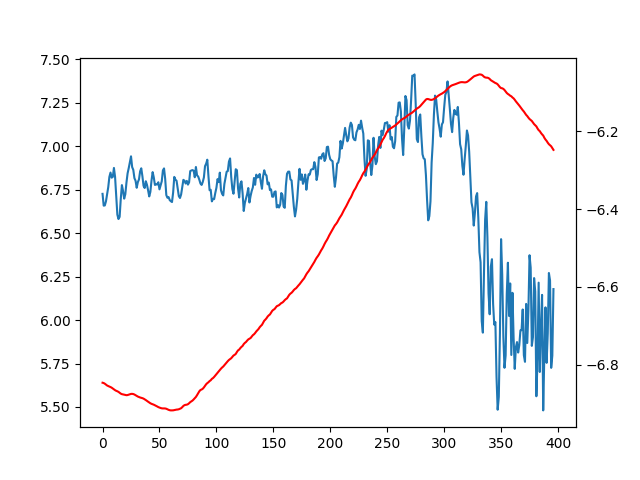

In [ ]:
def fit_box(x0,middle_px,signal):
    x1 = x0 +int(middle_px)
    return(-np.nanmean(signal[x0:x1]))

leeway = main_channel_width_px
width = main_channel_width_px
begin = int(x_middle-width/2-leeway)
end = int(x_middle)
min_period_um = 60
min_period_pixel = int(min_period_um/pixel_size["X"])
y = [periodicity_entropy(img[x,2000:],min_period_pixel) for x in range(img.shape[0])]
fits=[fit_box(x0,main_channel_width_px,y) for x0 in range(len(y)-int(middle_px))]
fig,ax = plt.subplots()
ax2 = ax.twinx()
ax2.plot(fits[begin:end],color = "red")
ax.plot(y[begin:end])
x_middle2 = np.argmin(fits[begin:end])+main_channel_width_px/2+begin
x_middle2,x_middle

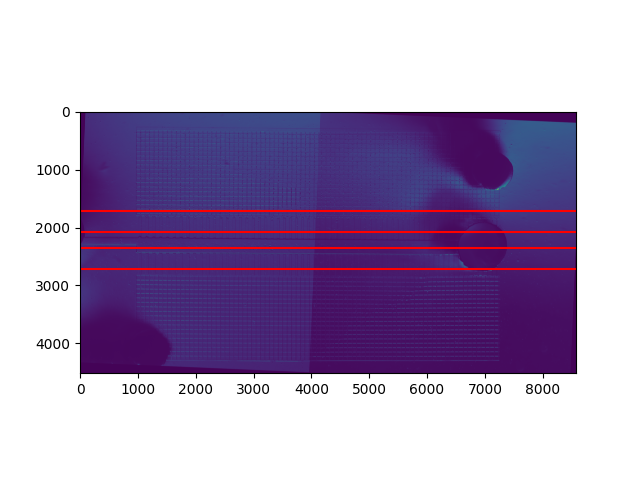

In [ ]:
fig,ax = plt.subplots()
ax.imshow(img_rotate2)
ax.axhline(x_middle2-main_channel_width_px/2,color = "red")
ax.axhline(x_middle2+main_channel_width_px/2,color = "red")
ax.axhline(x_middle2-middle_px/2,color = "red")
ax.axhline(x_middle2+middle_px/2,color = "red")

In [ ]:
dicjwec

NameError: name 'dicjwec' is not defined

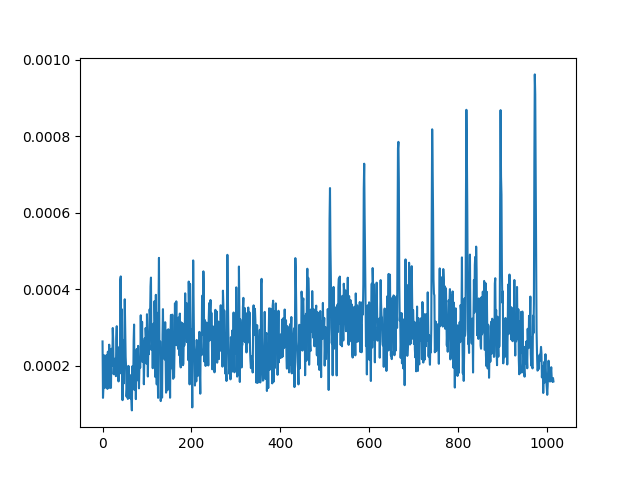

In [ ]:

fs = 1
periodicity_fft(img[2500,:],fs,period_pixel),periodicity_fft(img[1300,:],fs,period_pixel)
y = [periodicity_fft(img[x,2000:],fs,period_pixel,period_pixel//5) for x in range(img.shape[0])]
yanti = [periodicity_fft(img[x,2000:],fs,period_pixel-period_pixel/2,period_pixel//10) for x in range(img.shape[0])]
peakness = np.array(y)/np.array(yanti)
fig,ax = plt.subplots()
begin = int(x_middle-middle_px/2)
end = int(x_middle+middle_px/2)
ax.plot(y[begin:end])
# ax.plot(yanti[begin:end])
# ax.plot(y)



In [ ]:
peakness

array([0.4368406 , 0.4574869 , 0.36442193, ..., 0.5605288 , 0.6545153 ,
       0.5740533 ], shape=(4512,), dtype=float32)

(np.float64(2006.2992678199498), np.float64(1950.0291884286073))

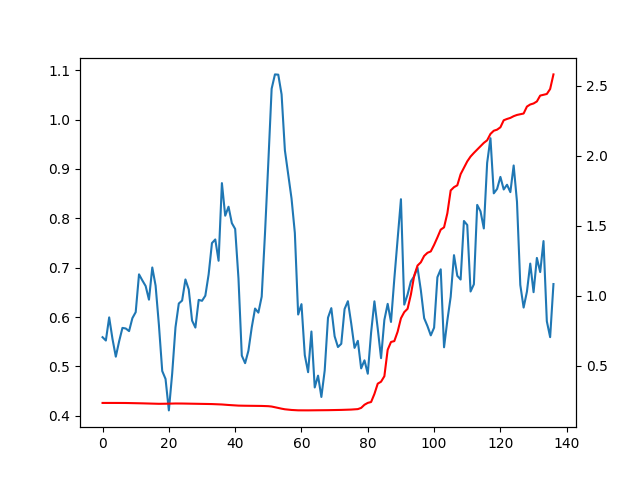

In [ ]:
def fit_box(x0,middle_px,signal):
    x1 = x0 +int(middle_px)
    return(np.nanmean(signal[x0:x1]**4))

leeway = main_channel_width_px/64
width = main_channel_width_px
begin = int(x_middle-width/2-leeway)
end = int(x_middle)

fits=[fit_box(x0,main_channel_width_px,peakness) for x0 in range(len(y)-int(middle_px))]
fig,ax = plt.subplots()
ax2 = ax.twinx()
ax2.plot(fits[begin:end],color = "red")
ax.plot(peakness[begin:end])
x_middle2 = np.argmin(fits[begin:end])+main_channel_width_px/2+begin
x_middle2,x_middle

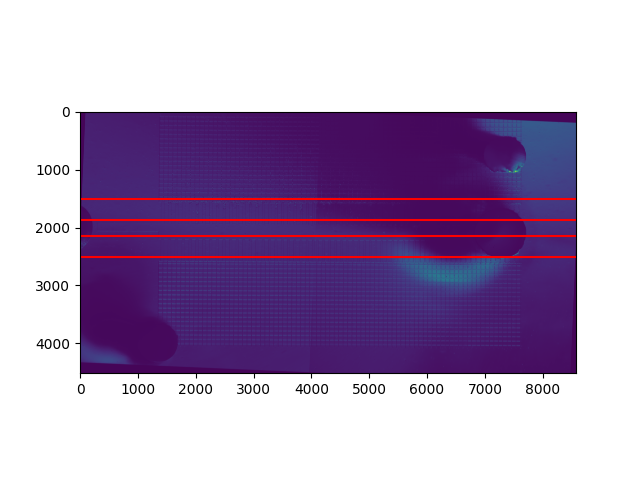

In [ ]:
fig,ax = plt.subplots()
ax.imshow(img_rotate2)
ax.axhline(x_middle2-main_channel_width_px/2,color = "red")
ax.axhline(x_middle2+main_channel_width_px/2,color = "red")
ax.axhline(x_middle2-middle_px/2,color = "red")
ax.axhline(x_middle2+middle_px/2,color = "red")

In [ ]:
evwev

NameError: name 'evwev' is not defined

In [ ]:
np.argmin(fits[begin:end])

np.int64(55)

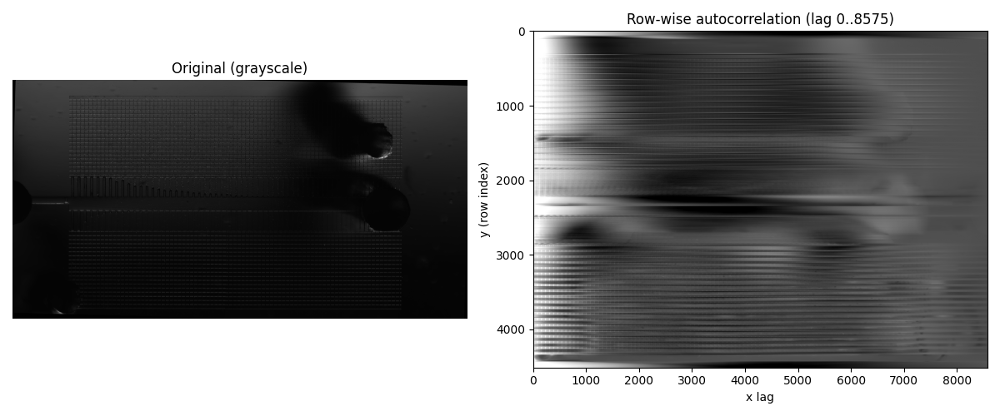

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def row_autocorrelation_image(gray: np.ndarray, normalize=True, subtract_mean=True) -> np.ndarray:
    """
    Compute per-row (per y) autocorrelation along x.
    Returns an array of shape (H, W) where column k is correlation at lag k (0..W-1).
    """
    if gray.ndim != 2:
        raise ValueError("Expected a 2D grayscale image array.")

    H, W = gray.shape
    x = gray.astype(np.float32)

    if subtract_mean:
        x = (x - x.mean(axis=1, keepdims=True))

    # FFT-based autocorrelation per row:
    # r[k] = ifft(FFT(x) * conj(FFT(x)))  (circular). We zero-pad to get linear autocorr.
    n = 2 * W  # zero-pad to avoid circular wrap (enough for linear autocorr up to W-1)
    X = np.fft.rfft(x, n=n, axis=1)
    S = X * np.conj(X)
    r = np.fft.irfft(S, n=n, axis=1)  # shape (H, n)

    # Keep non-negative lags 0..W-1 (linear autocorr)
    r = r[:, :W]

    if normalize:
        # Normalize so r[:,0] == 1 (avoid divide-by-zero for flat rows)
        r0 = r[:, [0]]
        r = np.divide(r, r0, out=np.zeros_like(r), where=(r0 != 0))

    return r

def load_grayscale(path: str) -> np.ndarray:
    img = Image.open(path).convert("L")  # grayscale
    return np.array(img)

def show_original_and_autocorr(gray: np.ndarray, ac: np.ndarray, max_lag=None):
    H, W = gray.shape
    if max_lag is None:
        max_lag = W - 1
    max_lag = int(np.clip(max_lag, 1, W - 1))

    # For visualization: crop to max_lag, and scale robustly
    ac_vis = ac[:, :max_lag + 1]

    # Robust scaling for display
    lo, hi = np.percentile(ac_vis, [1, 99])
    if hi <= lo:
        lo, hi = ac_vis.min(), ac_vis.max() + 1e-6

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.title("Original (grayscale)")
    plt.imshow(gray, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Row-wise autocorrelation (lag 0..{max_lag})")
    plt.imshow(ac_vis, cmap="gray", vmin=lo, vmax=hi, aspect="auto")
    plt.xlabel("x lag")
    plt.ylabel("y (row index)")
    plt.tight_layout()
    plt.show()

ac = row_autocorrelation_image(img_rotate2, subtract_mean=True)
show_original_and_autocorr(img_rotate2, ac)

In [ ]:
73/pixel_size["X"]

77.20948773622635

In [ ]:
from scipy.signal import detrend
def periodicity_autocorr(x, period,window =2):
    x = np.asarray(x)
    x = detrend(x)              # remove constant/linear trend
    x = x / np.std(x)

    r = np.correlate(x, x, mode='full')
    r = r[len(r)//2:]
    r = r / r[0]                       # normalize autocorr

    return np.mean(r[period-window:period+window+1])

periodicity_autocorr(img[2500,:],period_pixel),periodicity_autocorr(img[1300,:],period_pixel)
y = [periodicity_autocorr(img[x,:],period_pixel) for x in range(img.shape[0])]


In [ ]:
img_rotate2.shape

(4512, 8576)

/var/folders/lc/xdhphxss45zfz02b14j8dhb00000gp/T/ipykernel_45914/140147515.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


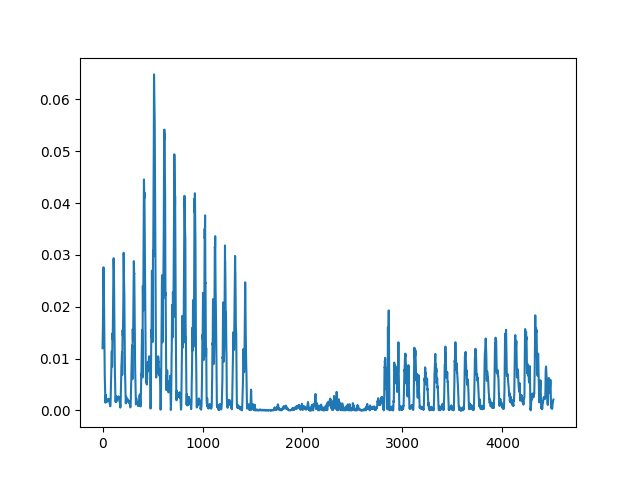

In [ ]:
fig,ax = plt.subplots()
ax.plot(y)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def fft_lines_in_period_space(img, pixel_size, detrend=True, window=True, eps=1e-12):
    """
    img: 2D array (H, W)
    pixel_size: physical size per pixel (e.g., meters/pixel)
    Returns:
        periods: (W//2,) array of periods in same units as pixel_size (excluding DC)
        power: (H, W//2) power spectrum per row vs period (excluding DC)
    """
    img = np.asarray(img, dtype=float)
    H, W = img.shape
    L = W * pixel_size  # total observed length of each row

    x = img.copy()

    # Optional: remove per-row mean / linear trend (mean removal is often enough)
    if detrend:
        # remove mean per row
        x = (x - x.mean(axis=1, keepdims=True))/np.std(x,axis=1, keepdims=True)

    # Optional: window each row to reduce spectral leakage
    if window:
        w = np.hanning(W)[None, :]
        x = x * w

    # Real FFT along each row
    F = np.fft.rfft(x, axis=1)

    # Power spectrum
    P = (np.abs(F) ** 2)
    P = P

    # Spatial frequencies for rfft bins (cycles per unit length)
    freqs = np.fft.rfftfreq(W, d=pixel_size)  # includes DC at index 0

    # Convert to periods, excluding DC (freq=0)
    freqs_nonzero = freqs[1:]                       # shape: (W//2,)
    periods = 1.0 / freqs_nonzero                   # period in physical units
    power = P[:, 1:]                                # drop DC to match periods

    # Note: periods will run from large -> small as k increases
    # If you prefer ascending periods, sort them:
    order = np.argsort(periods)                     # small -> large
    return periods[order], power[:, order]


# --- Example plotting helper ---
def plot_line_period_spectrum(periods, power, row_idx=0, log_power=True):
    y = power[row_idx].copy()
    if log_power:
        y = np.log10(y + 1e-12)

    plt.plot(periods, y)
    plt.xlabel("Period (same units as pixel_size)")
    plt.ylabel("log10(Power)" if log_power else "Power")
    plt.title(f"Row {row_idx}: FFT in period space")
    plt.gca().invert_xaxis()  # optional: show large periods on the left (common in some fields)


def plot_period_map(periods, power, log_power=True):
    Z = power.copy()
    if log_power:
        Z = np.log10(Z + 1e-12)

    # x-axis is period; show as extent so axis has physical meaning
    plt.imshow(Z, aspect="auto",
               extent=[periods.max(), periods.min(), Z.shape[0]-1, 0])
    plt.xlabel("Period (same units as pixel_size)")
    plt.ylabel("Row index")
    plt.title("Per-row FFT power in period space" + (" (log10)" if log_power else ""))


In [ ]:
totals = power.sum(axis=1)
print(totals.min(), totals.max())

957727.9999999998 961350.1733968387


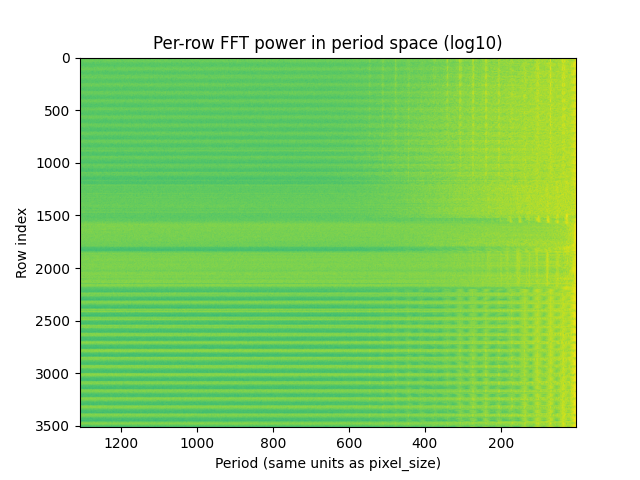

In [ ]:
fig,ax = plt.subplots()
periods, power = fft_lines_in_period_space(img, pixel_size["X"],window= False)
# plot_line_period_spectrum(periods,power,2600)
# plot_line_period_spectrum(periods,power,1500)
plot_period_map(periods,power)
# ax.imshow(np.log10(power+0.0001))
# ax.plot(np.log10(power[2600,:]))


In [ ]:
pixel_size["X"]

0.9454796572332227

In [ ]:
int(1/(period_um/pixel_size["X"]))

0

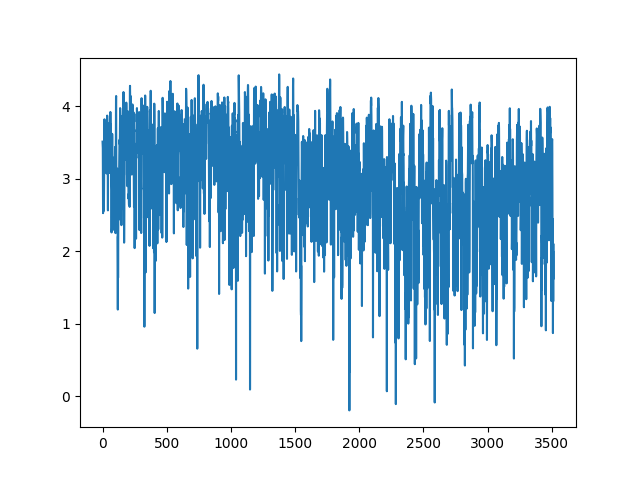

In [ ]:
period_um = 73
fig,ax = plt.subplots()
period_pixel = period_um/pixel_size["X"]
frequency_pixel = int(1/period_pixel*img.shape[0])
ax.plot(np.log10(np.mean(power[:,-frequency_pixel:-frequency_pixel+1],axis = 1)))

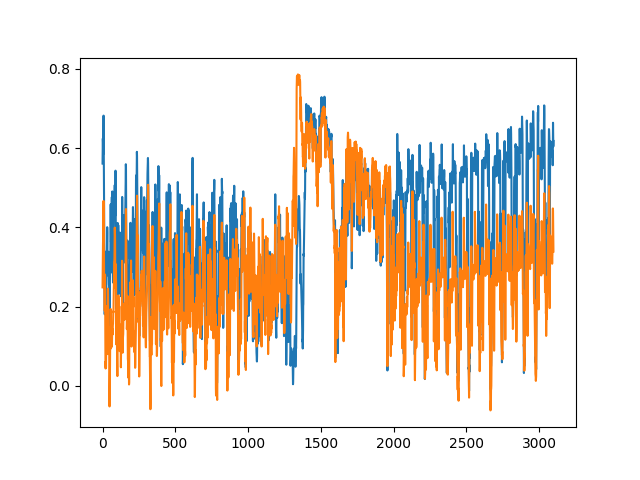

In [ ]:
fig,ax = plt.subplots()
ax.plot(ac[:,80])
ax.plot(ac[:,105])


y=   0  second_peak_lag=  77  value=+0.644  prominence=+0.360
y=   1  second_peak_lag=  77  value=+0.681  prominence=+0.358
y=   2  second_peak_lag=  77  value=+0.702  prominence=+0.324
y=   3  second_peak_lag=  77  value=+0.682  prominence=+0.252
y=   4  second_peak_lag=  77  value=+0.654  prominence=+0.205
y=   5  second_peak_lag=  77  value=+0.661  prominence=+0.175
y=   6  second_peak_lag=  77  value=+0.719  prominence=+0.196
y=   7  second_peak_lag=  77  value=+0.752  prominence=+0.222
y=   8  second_peak_lag=  77  value=+0.693  prominence=+0.213
y=   9  second_peak_lag=  77  value=+0.623  prominence=+0.220


/var/folders/lc/xdhphxss45zfz02b14j8dhb00000gp/T/ipykernel_30779/3802935226.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


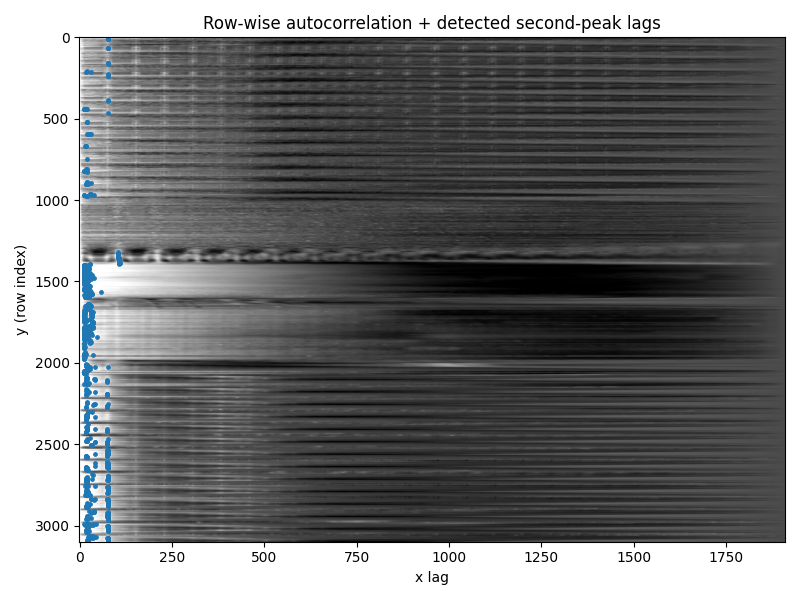

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def row_autocorrelation_image(gray: np.ndarray, normalize=True, subtract_mean=True) -> np.ndarray:
    if gray.ndim != 2:
        raise ValueError("Expected 2D grayscale.")
    H, W = gray.shape
    x = gray.astype(np.float32)
    if subtract_mean:
        x = x - x.mean(axis=1, keepdims=True)

    n = 2 * W
    X = np.fft.rfft(x, n=n, axis=1)
    S = X * np.conj(X)
    r = np.fft.irfft(S, n=n, axis=1)[:, :W]

    if normalize:
        r0 = r[:, [0]]
        r = np.divide(r, r0, out=np.zeros_like(r), where=(r0 != 0))
    return r

def second_peak_metrics(
    ac: np.ndarray,
    lag_min: int = 1,
    lag_max: int | None = None,
    min_peak_height: float = 0.1,
    neighborhood: int = 3,
):
    """
    For each row y, find the strongest local maximum of ac[y, lag] for lag in [lag_min, lag_max].
    Returns arrays:
      lag (int, -1 if none), value, prominence
    - min_peak_height is on the normalized autocorr scale if your ac is normalized (lag 0 is 1).
    - neighborhood controls how 'local max' and prominence are computed.
    """
    H, W = ac.shape
    if lag_max is None:
        lag_max = W - 1
    lag_min = max(1, int(lag_min))
    lag_max = min(W - 1, int(lag_max))
    if lag_max <= lag_min:
        raise ValueError("lag_max must be > lag_min")

    lags = np.arange(W)

    best_lag = np.full(H, -1, dtype=int)
    best_val = np.full(H, np.nan, dtype=np.float32)
    best_prom = np.full(H, np.nan, dtype=np.float32)

    # restrict region of interest
    roi = ac[:, lag_min:lag_max + 1]  # shape (H, L)
    L = roi.shape[1]

    # local max test: roi[:, i] > roi[:, i-1] and >= roi[:, i+1]
    # We'll only test i = 1..L-2 to have neighbors inside ROI.
    if L < 3:
        return best_lag, best_val, best_prom

    mid = roi[:, 1:-1]
    left = roi[:, :-2]
    right = roi[:, 2:]
    is_peak = (mid > left) & (mid >= right) & (mid >= min_peak_height)

    # For each row, among candidate peaks, take the highest value
    # If multiple equal, take the smallest lag.
    mid_vals = np.where(is_peak, mid, -np.inf)  # shape (H, L-2)
    idx = np.argmax(mid_vals, axis=1)  # index into 0..L-3
    peak_val = mid_vals[np.arange(H), idx]

    has = np.isfinite(peak_val) & (peak_val > -np.inf)

    # Convert idx (in mid slice) to lag in full ac
    peak_lag_in_roi = (idx + 1)  # because mid starts at roi[:,1]
    peak_lag = peak_lag_in_roi + lag_min  # shift into full lag coordinates

    # Prominence (simple): peak - max(min in left window, min in right window) around the peak
    # Use a neighborhood window on each side; you can swap for a more elaborate method if needed.
    prom = np.full(H, np.nan, dtype=np.float32)
    for y in np.where(has)[0]:
        i = peak_lag_in_roi[y]  # index within roi (0..L-1)
        p = roi[y, i]

        l0 = max(0, i - neighborhood)
        l1 = i
        r0 = i + 1
        r1 = min(L, i + 1 + neighborhood)

        left_base = np.min(roi[y, l0:l1]) if l1 > l0 else p
        right_base = np.min(roi[y, r0:r1]) if r1 > r0 else p
        base = max(left_base, right_base)
        prom[y] = p - base

    best_lag[has] = peak_lag[has]
    best_val[has] = peak_val[has].astype(np.float32)
    best_prom[has] = prom[has]

    return best_lag, best_val, best_prom

def load_grayscale(path: str) -> np.ndarray:
    return np.array(Image.open(path).convert("L"))

def show_ac_with_second_peaks(ac: np.ndarray, best_lag: np.ndarray, max_lag=None):
    H, W = ac.shape
    if max_lag is None:
        max_lag = W - 1
    max_lag = int(np.clip(max_lag, 1, W - 1))

    ac_vis = ac[:, :max_lag + 1]
    lo, hi = np.percentile(ac_vis, [1, 99])
    if hi <= lo:
        lo, hi = ac_vis.min(), ac_vis.max() + 1e-6

    plt.figure(figsize=(8, 6))
    plt.title("Row-wise autocorrelation + detected second-peak lags")
    plt.imshow(ac_vis, cmap="gray", vmin=lo, vmax=hi, aspect="auto")
    plt.xlabel("x lag")
    plt.ylabel("y (row index)")

    ys = np.arange(H)
    mask = (best_lag >= 0) & (best_lag <= max_lag)
    plt.scatter(best_lag[mask], ys[mask], s=6)
    plt.tight_layout()
    plt.show()


ac = row_autocorrelation_image(img, normalize=True, subtract_mean=True)

lag, val, prom = second_peak_metrics(
    ac,
    lag_min=10,
    lag_max=200,
    min_peak_height=0.6,
    neighborhood=50,
)

# Example: print summary for first 10 rows that have a peak
idxs = np.where(lag >= 0)[0][:10]
for y in idxs:
    print(f"y={y:4d}  second_peak_lag={lag[y]:4d}  value={val[y]:+.3f}  prominence={prom[y]:+.3f}")

show_ac_with_second_peaks(ac, lag, max_lag=None)